In [1]:
%matplotlib inline

In [45]:
# Tests gaussian blur, laplacian, hough circles

In [2]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

In [3]:
#Function goes through Sample Images
#Tests the Laplacian variance function

k_list = []
file_name = os.listdir("F://Image_Code/AutomatedQC/Test")
for infile in file_name:
    img = cv2.imread(infile,0)
    print infile,":", cv2.Laplacian(img, cv2.CV_8U).var()

WindowsError: [Error 3] The system cannot find the path specified: 'F://Image_Code/AutomatedQC/Test/*.*'

In [4]:
#Function tests Laplacian variance function and alternate way to write it
#Used to test if equivalent to use in C++

file_name = os.listdir(".")
k_list = []
for infile in file_name:
    if (infile[-4:] == ".tif"):
        k_list.append(infile)

for infile in k_list:
    img = cv2.imread(infile, 0)
    dst = cv2.Laplacian(img, cv2.CV_64F)
    (meaan, stddev) = cv2.meanStdDev(dst)
    ans = stddev[0] * stddev[0]
    print infile,": ", cv2.Laplacian(img, cv2.CV_64F).var() , "      ", ans

bubble_mask1.tif :  678.171425663        [ 678.17142566]
bubble_mask2.tif :  1168.85244351        [ 1168.85244351]
bubble_mask3.tif :  1196.43339474        [ 1196.43339474]


In [5]:
#Function tests erosion, dilation and fastNlMeansDenoising in OpenCV

import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("Image (19).tif",0)
kernel = np.ones((5,5), np.uint8)
erosion=cv2.erode(img, kernel, iterations=1)
plt.imshow(erosion)
plt.show()
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.imshow(dilation)
plt.show()
img = cv2.imread("Image (19).tif")
dst = cv2.fastNlMeansDenoisingColored(img, None, 1, 1, 5, 20)
plt.imshow(dst)
plt.show()

error: ..\..\..\..\opencv\modules\core\src\matrix.cpp:269: error: (-215) m.dims >= 2 in function cv::Mat::Mat


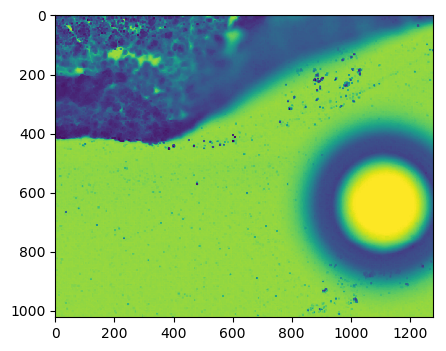

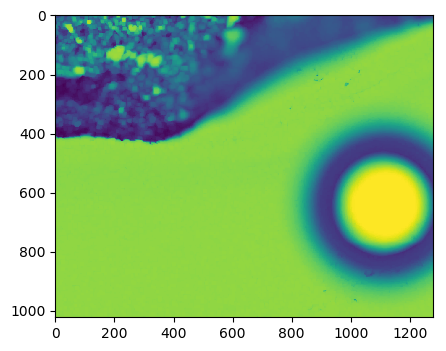

(0L, '-', 255L, 0L, '-', 255L) : 47.8630818862
(0L, '-', 255L, 255L, '-', 510L) : 35.9359331195
(0L, '-', 255L, 510L, '-', 765L) : 35.6674096965
(0L, '-', 255L, 765L, '-', 1020L) : 57.7847777861
(0L, '-', 255L, 1020L, '-', 1275L) : 50.6496802539
(255L, '-', 510L, 0L, '-', 255L) : 77.4169947543
(255L, '-', 510L, 255L, '-', 510L) : 73.4119504012
(255L, '-', 510L, 510L, '-', 765L) : 47.4115913266
(255L, '-', 510L, 765L, '-', 1020L) : 44.8848544502
(255L, '-', 510L, 1020L, '-', 1275L) : 60.1040546388
(510L, '-', 765L, 0L, '-', 255L) : 1.03903267546
(510L, '-', 765L, 255L, '-', 510L) : 1.09350717385
(510L, '-', 765L, 510L, '-', 765L) : 1.27477566534
(510L, '-', 765L, 765L, '-', 1020L) : 61.4395833071
(510L, '-', 765L, 1020L, '-', 1275L) : 50.5700259965
(765L, '-', 1020L, 0L, '-', 255L) : 0.615660533519
(765L, '-', 1020L, 255L, '-', 510L) : 0.622320583397
(765L, '-', 1020L, 510L, '-', 765L) : 0.675105395486
(765L, '-', 1020L, 765L, '-', 1020L) : 45.8074358316
(765L, '-', 1020L, 1020L, '-', 1

In [6]:
#Function crops black bar out of image, tests erosion and dilation
#Prints standard deviation of each block

import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image26.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)

kernel = np.ones((5,5), np.uint8)
erosion=cv2.erode(image, kernel, iterations=1)
plt.imshow(erosion)
plt.show()
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.imshow(dilation)
plt.show()
total = 0
r = dilation.shape[0]/4
c = dilation.shape[1]/5
for i in range(4):
    for j in range(5):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        print (i*r,"-",(i+1)*r,j*c,"-",(j+1)*c),":",a
        total += a
print
print "Total:",total
print "Std dev on whole image:", np.std(img)
print type(i)
print type(a)
print type(total)

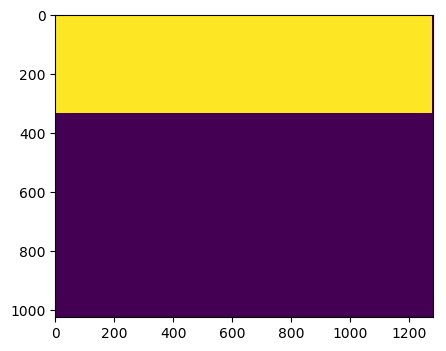

In [7]:
#Function draws external contours on image with black bar

import numpy as np
import matplotlib.pyplot as plt
import cv2

img = cv2.imread("../Images/GImage7.tif",0)
edges = cv2.Canny(img,100, 200)
c, h = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cv2.drawContours(img, c, 0, (0,255,0),3)
plt.imshow(img)
plt.show()

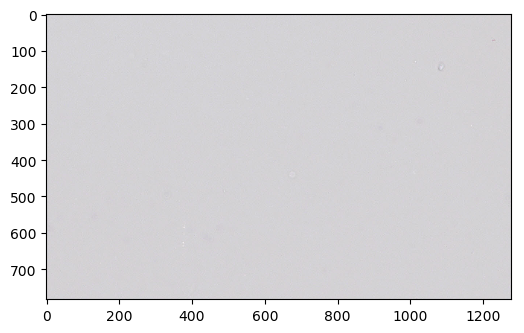

In [8]:
#Function tests Cropping with black and white bar. Erases black bar. Not white.

import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("../Images/Image25.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray,1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
plt.imshow(crop)
plt.show()

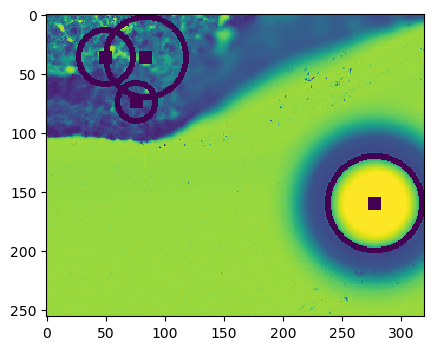

In [9]:
#Function tests Hough Circle Transform Function

img = cv2.imread("../Images/Image26.tif", 0)
crop=cv2.resize(img, (320,256))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 20, param1 = 80, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

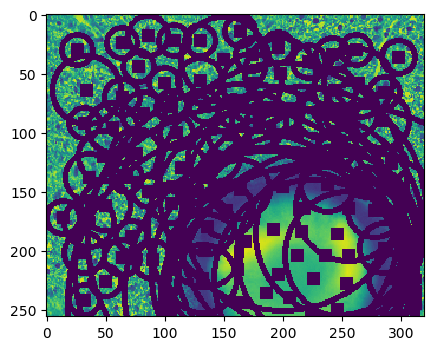

In [10]:
#Function tests Hough Circle Transform Function

img = cv2.imread("../Images/Image8.tif", 0)
crop=cv2.resize(img, (320,256))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 20, param1 = 80, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

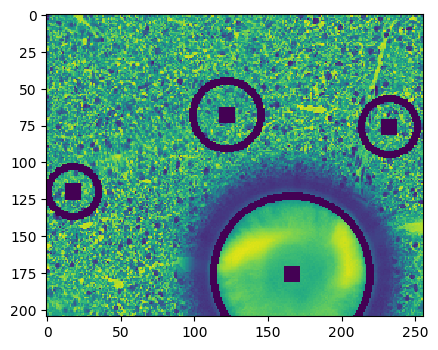

In [11]:
img = cv2.imread("../Images/Image8.tif", 0)
crop=cv2.resize(img, (256,205))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 100, param1 = 80, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

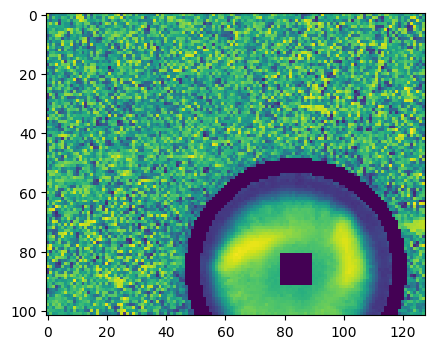

In [12]:
img = cv2.imread("../Images/Image8.tif", 0)
crop=cv2.resize(img, (128,102))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 100, param1 = 90, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

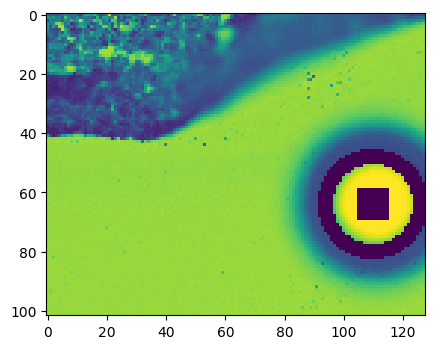

In [13]:
img = cv2.imread("../Images/Image26.tif", 0)
crop=cv2.resize(img, (128,102))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 100, param1 = 90, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

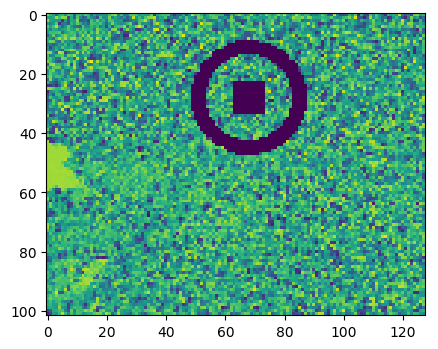

In [14]:
img = cv2.imread("../Images/GImage4.tif", 0)
kernel = np.ones((5,5), np.uint8)
#erosion = cv2.erode(crop,kernel, iterations=1)
crop=cv2.resize(img, (128,102))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 100, param1 = 90, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

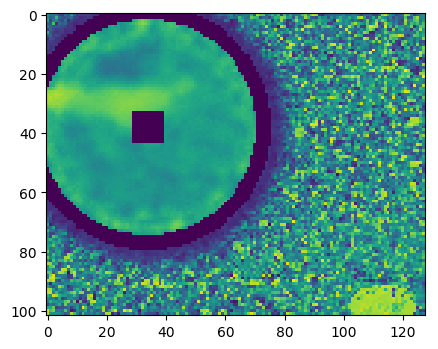

In [15]:
img = cv2.imread("../Images/Image20.tif", 0)
crop=cv2.resize(img, (128,102))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 100, param1 = 90, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

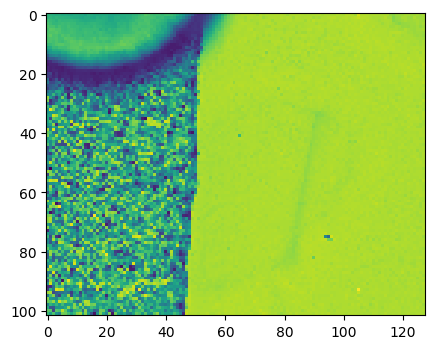

In [16]:
img = cv2.imread("../Images/Image13.tif", 0)
crop=cv2.resize(img, (128,102))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 100, param1 = 90, param2 = 50, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

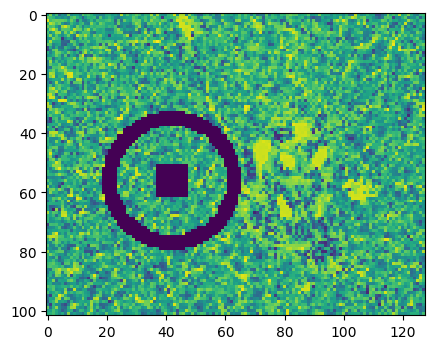

In [17]:
img = cv2.imread("../Images/GImage22.tif", 0)
crop=cv2.resize(img, (128,102))
circles = cv2.HoughCircles(crop, cv2.cv.CV_HOUGH_GRADIENT, 1, 100, param1 = 90, param2 = 60, minRadius = 0, maxRadius = 0)
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x,y,r) in circles:
        cv2.circle(crop, (x,y), r, (0,255,0), 4)
        cv2.rectangle(crop, (x-5,y-5), (x+5, y+5), (0,128,255), -1)
        
plt.imshow(crop)
plt.show()

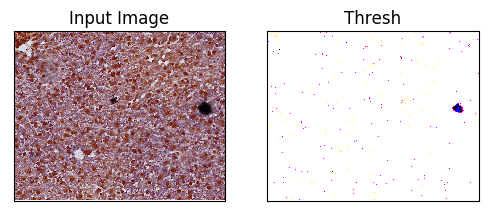

395


In [18]:
#Function tests ability to erase black chunks out of image

img = cv2.imread("../Images/Image36.tif")
_,thresh = cv2.threshold(img, 7, 255, cv2.THRESH_BINARY)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(thresh)
plt.title("Thresh"), plt.xticks([]), plt.yticks([])
plt.show()
print sum(sum(sum(thresh)))

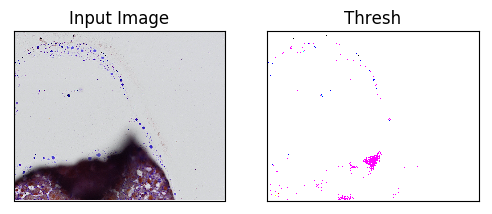

403


In [19]:
img = cv2.imread("../Images/Image19.tif")
_,thresh = cv2.threshold(img, 7, 255, cv2.THRESH_BINARY)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(thresh)
plt.title("Thresh"), plt.xticks([]), plt.yticks([])
plt.show()
print sum(sum(sum(thresh)))

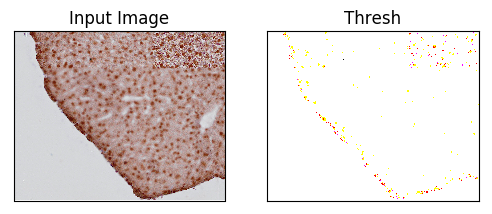

In [20]:
#Function seems to be able to tell blurry part from sharp part apart

img = cv2.imread("../Images/Image3.tif")
_,thresh = cv2.threshold(img, 20, 255, cv2.THRESH_BINARY)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(thresh)
plt.title("Thresh"), plt.xticks([]), plt.yticks([])
plt.show()

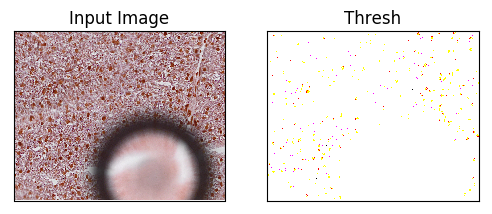

In [21]:
img = cv2.imread("../Images/Image8.tif")
_,thresh = cv2.threshold(img, 20, 255, cv2.THRESH_BINARY)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(thresh)
plt.title("Thresh"), plt.xticks([]), plt.yticks([])
plt.show()

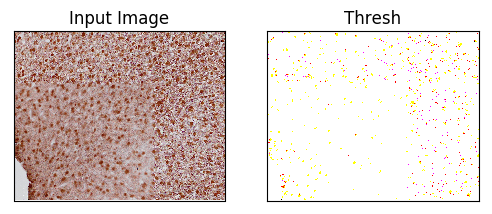

In [22]:
img = cv2.imread("../Images/Image38.tif")
_,thresh = cv2.threshold(img, 20, 255, cv2.THRESH_BINARY)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(thresh)
plt.title("Thresh"), plt.xticks([]), plt.yticks([])
plt.show()

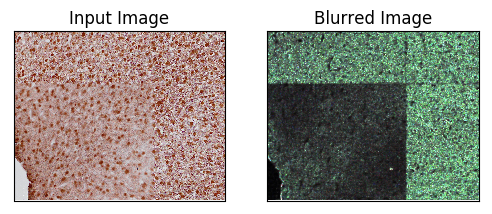

In [23]:
#answers.opencv.org/question/2934/single-image-depth-map-sharpness-map
#Testing separating blurry part from sharp


img = cv2.imread("../Images/Image38.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()

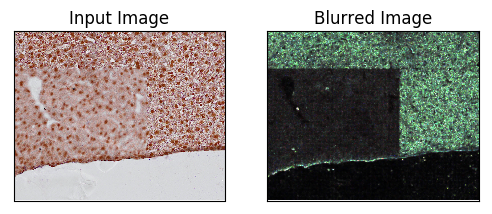

In [24]:
img = cv2.imread("../Images/Image2.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()


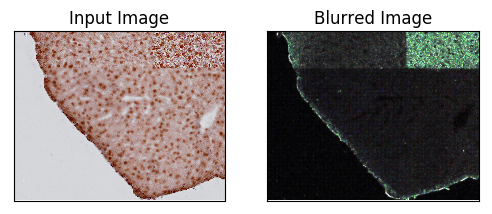

In [25]:
img = cv2.imread("../Images/Image3.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()


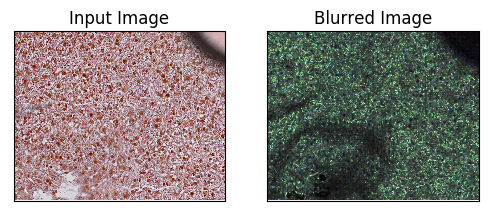

In [26]:
img = cv2.imread("../Images/Image10.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()


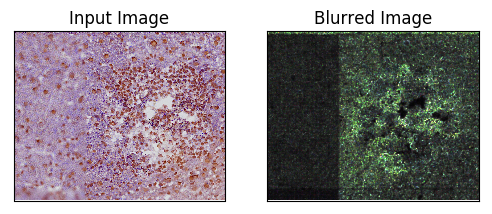

In [27]:
img = cv2.imread("../Images/Image14.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()

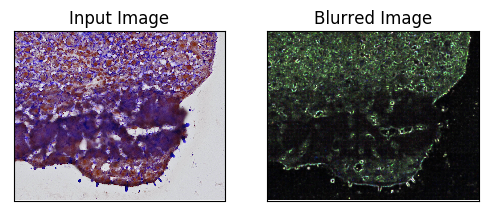

In [28]:
img = cv2.imread("../Images/Image18.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()


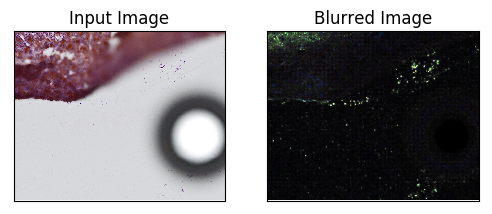

In [29]:
img = cv2.imread("../Images/Image26.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()


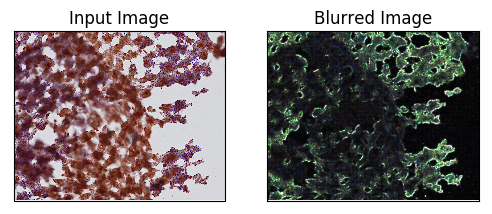

In [30]:
img = cv2.imread("../Images/Image27.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()

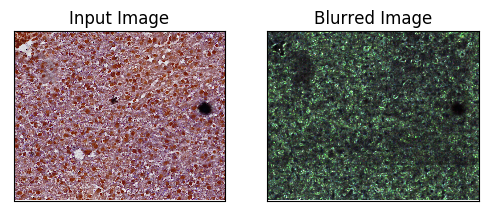

In [31]:
img = cv2.imread("../Images/Image36.tif")
laplacian = cv2.Laplacian(img, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)
plt.subplot(121), plt.imshow(img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()

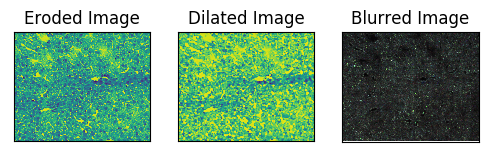

Original:  25.2518307905
Blur:  14.4739689031


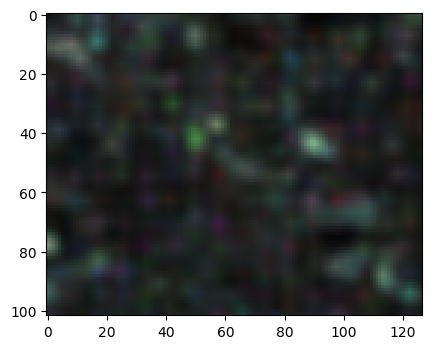

Original:  26.1433489084
Blur:  17.4300406894


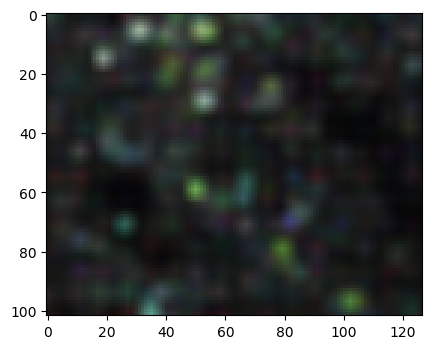

Original:  28.9241008812
Blur:  20.2557749454


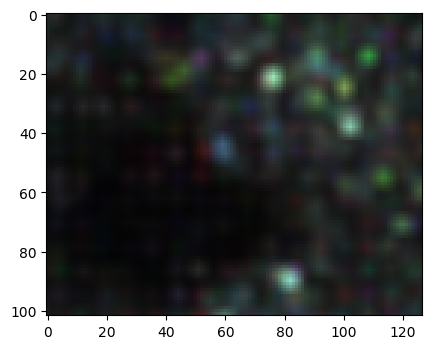

Original:  29.8622332968
Blur:  16.4129105601


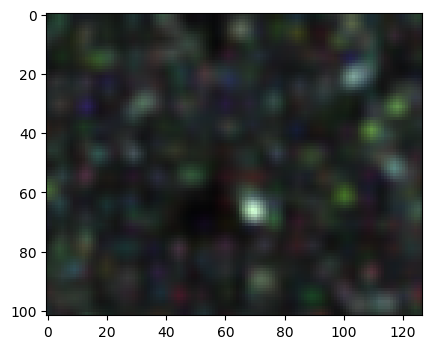

Original:  28.0770720487
Blur:  14.8972220343


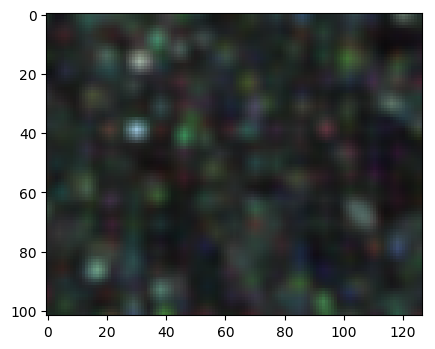

Original:  21.4859815919
Blur:  13.1055658772


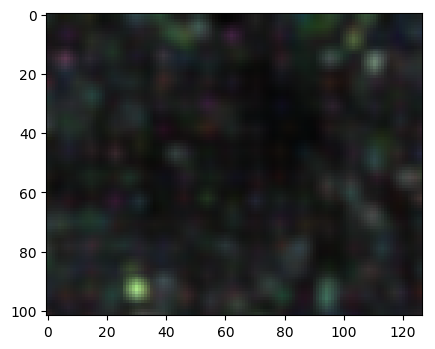

Original:  28.3800983332
Blur:  16.8471251794


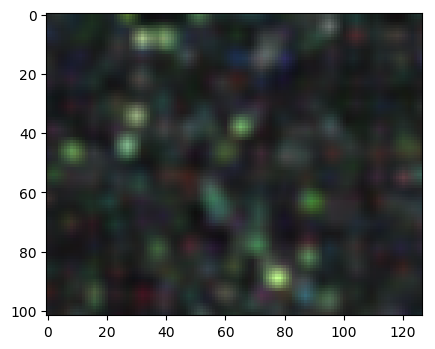

Original:  25.3717366439
Blur:  12.5384676878


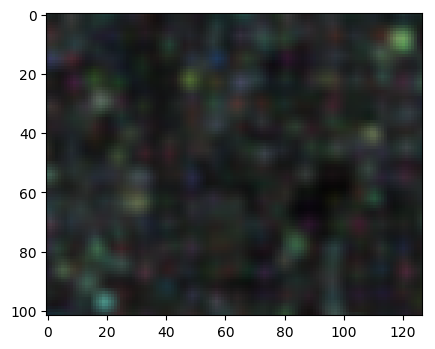

Original:  28.3191583023
Blur:  12.2681174979


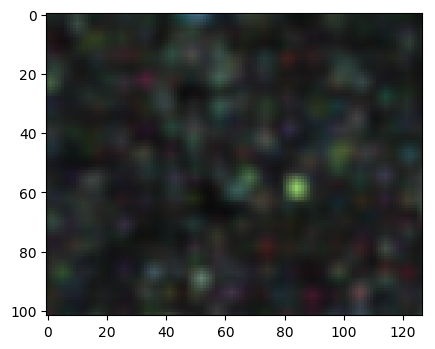

Original:  26.9758525422
Blur:  11.8889599688


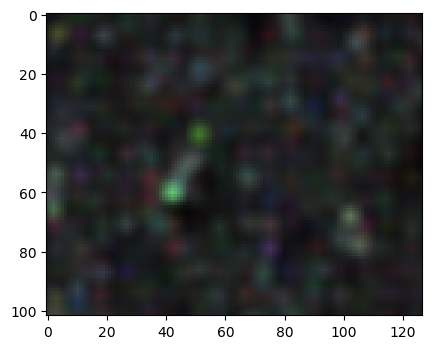

Original:  24.1223217467
Blur:  13.2569705903


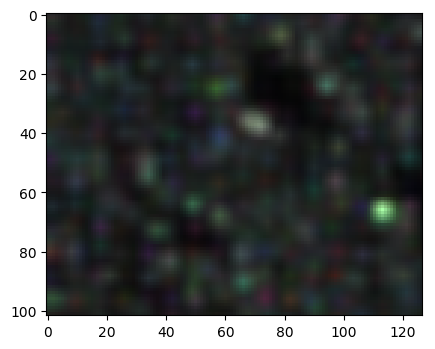

Original:  27.8410825445
Blur:  18.2940886314


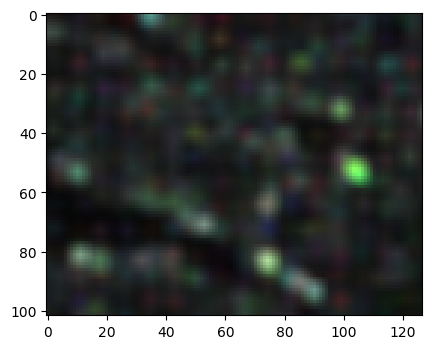

Original:  28.1470219945
Blur:  13.9681965378


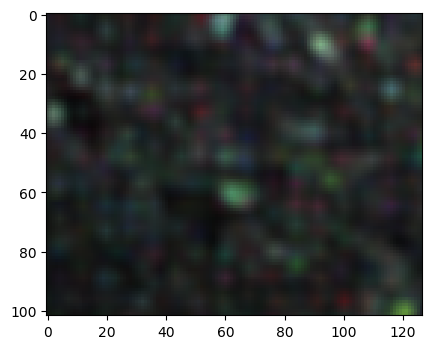

Original:  31.5551290175
Blur:  14.4390715551


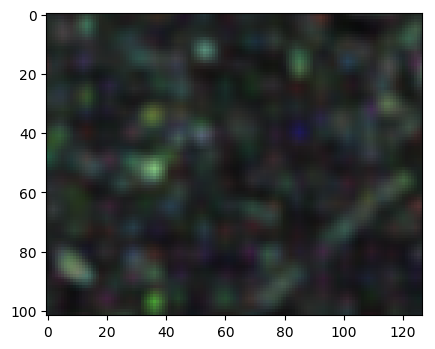

Original:  23.8916505951
Blur:  15.4523967436


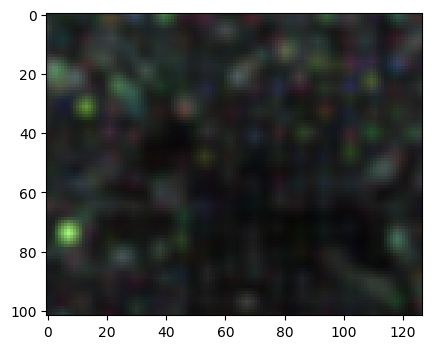

Original:  23.9318673017
Blur:  15.0130180751


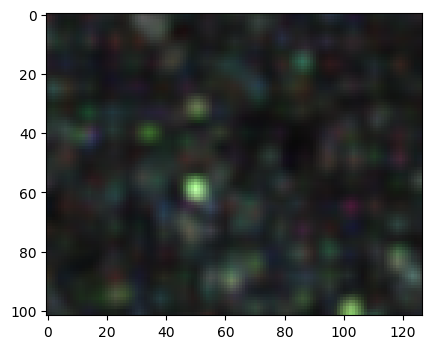

Original:  21.380421984
Blur:  10.8830488527


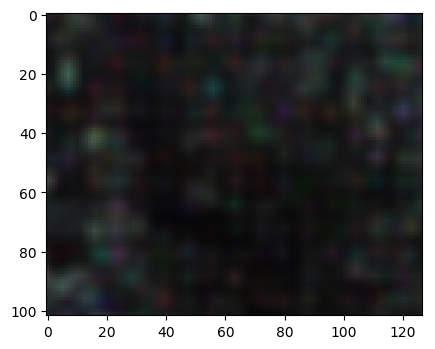

Original:  24.5355201335
Blur:  15.4447738292


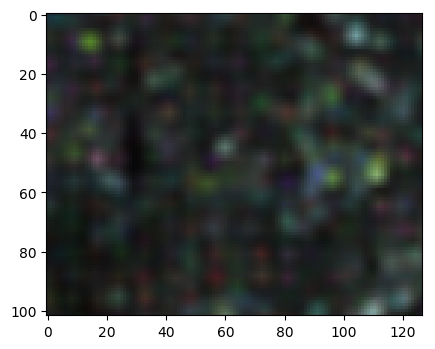

Original:  26.1635307971
Blur:  15.7272230383


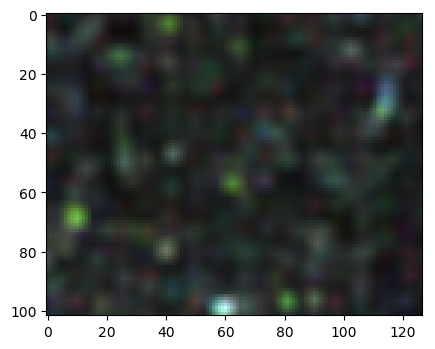

Original:  26.0211660617
Blur:  11.9588784142


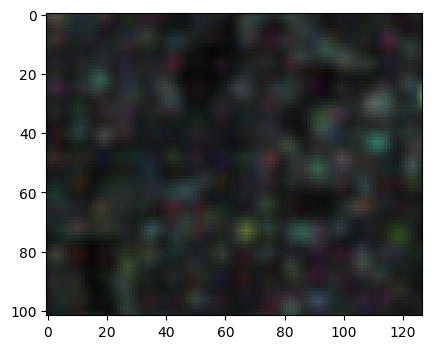

Original:  27.2730882397
Blur:  19.8991543625


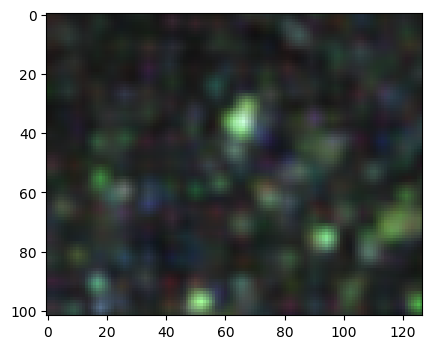

Original:  23.8202675548
Blur:  11.6647052866


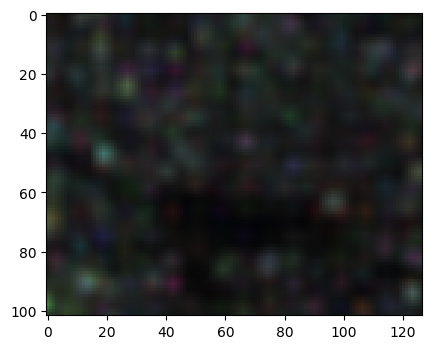

Original:  19.4674700478
Blur:  13.7878352778


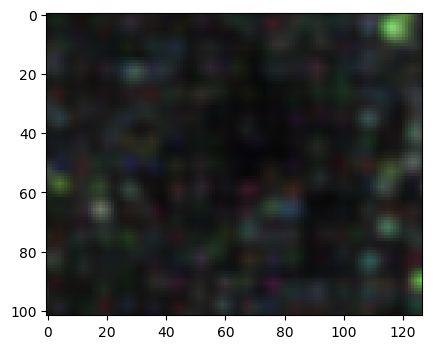

Original:  30.213715199
Blur:  19.2598165295


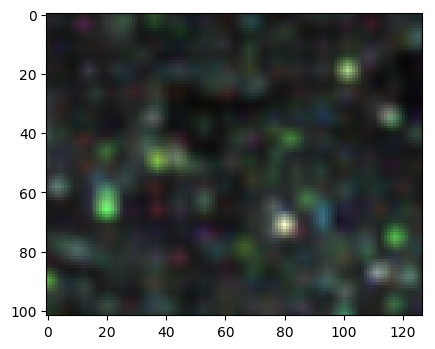

Original:  23.5549990185
Blur:  16.8096725871


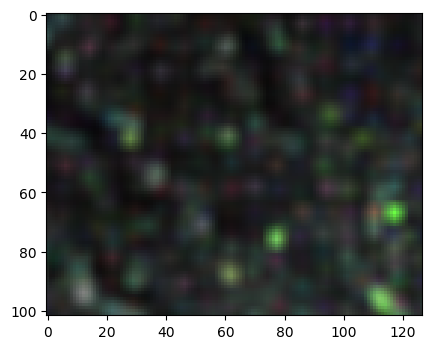

Original:  24.338525204
Blur:  15.0776738607


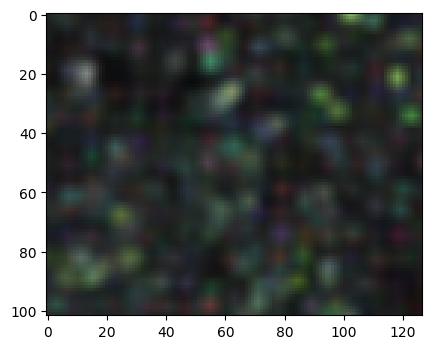

Original:  22.0041052626
Blur:  14.5452670369


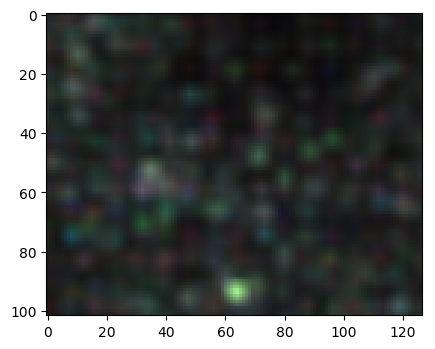

Original:  23.5429819743
Blur:  15.3729963652


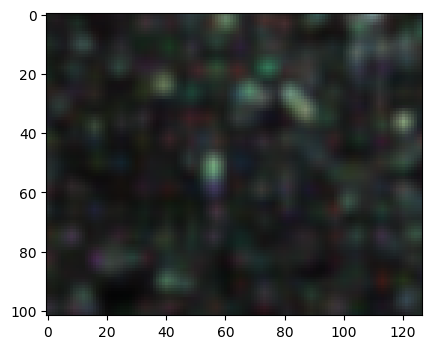

Original:  24.951630114
Blur:  12.9746904346


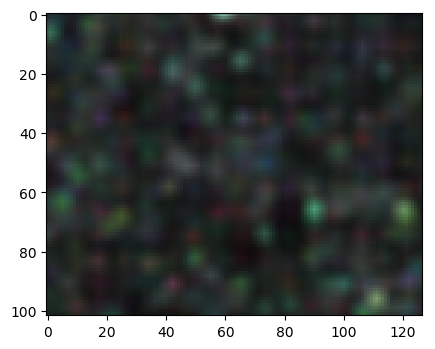

Original:  27.8346408737
Blur:  12.2177185525


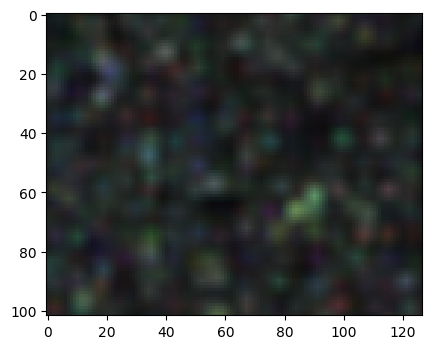

Original:  28.917549023
Blur:  21.9043209614


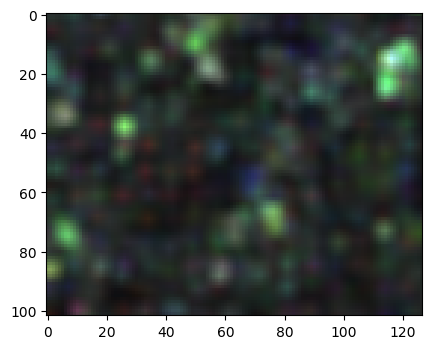

Original:  26.4400417245
Blur:  20.0168982474


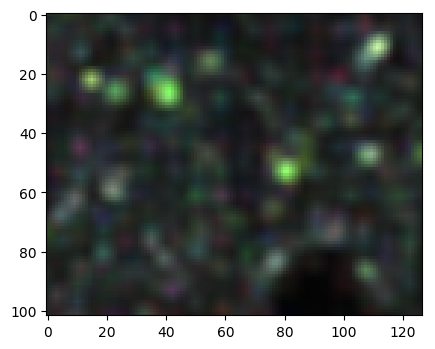

Original:  26.4724359345
Blur:  13.1751352785


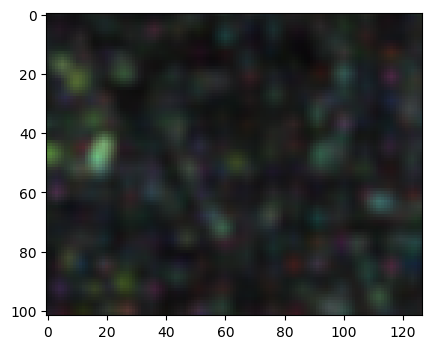

Original:  25.2345960836
Blur:  19.5050352492


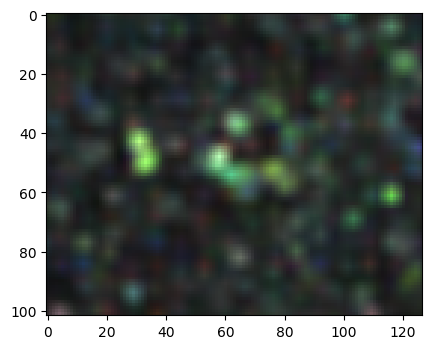

Original:  30.604628311
Blur:  14.7119067464


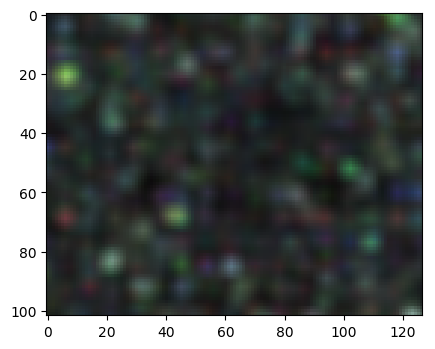

Original:  24.9837075695
Blur:  15.3279428796


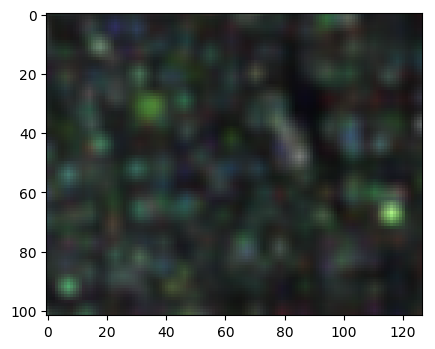

Original:  24.1175564775
Blur:  13.8201640495


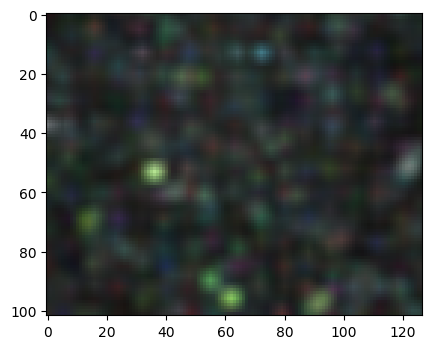

Original:  21.3376807648
Blur:  12.8105495617


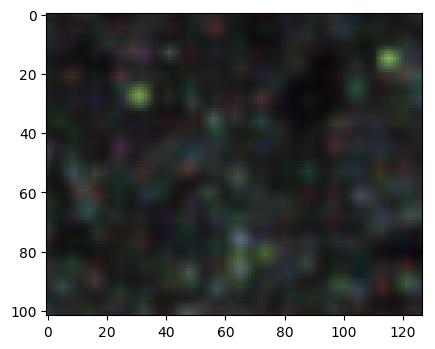

Original:  31.7307111011
Blur:  15.5555933255


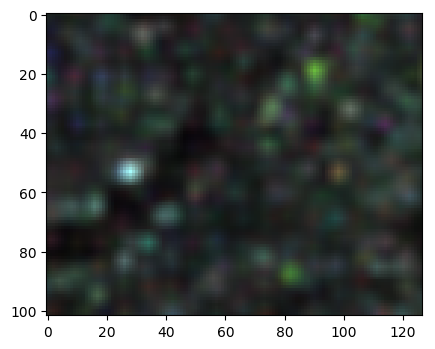

Original:  30.6011571775
Blur:  16.351177206


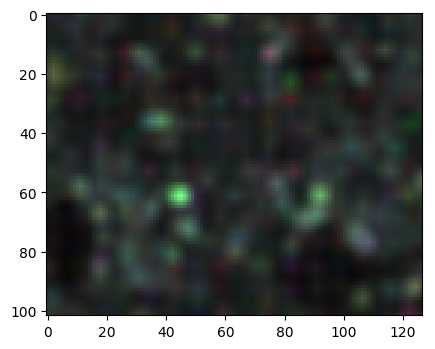

Original:  33.384068346
Blur:  16.3801901572


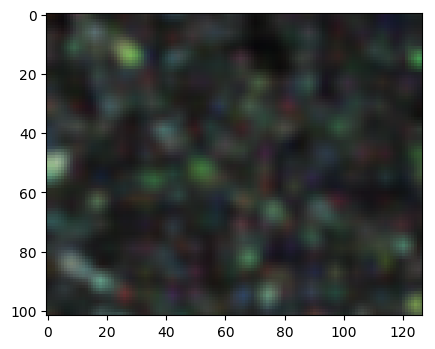

Original:  31.0949424231
Blur:  16.6861293779


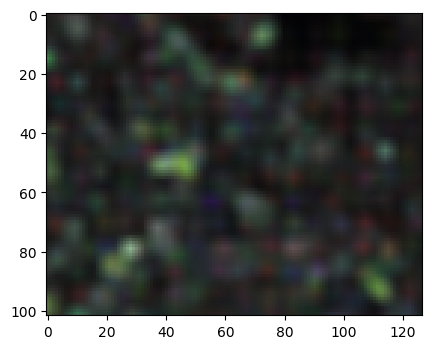

Original:  27.1421627364
Blur:  13.2445276619


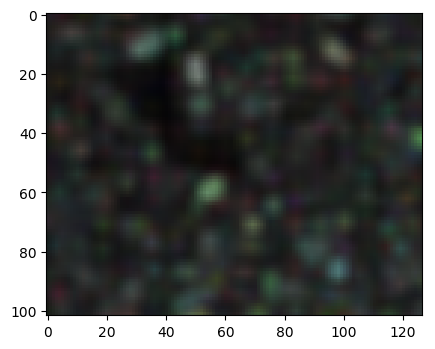

Original:  26.2689952968
Blur:  14.5954090799


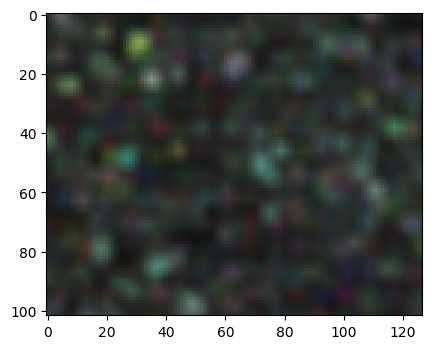

Original:  32.6117039645
Blur:  15.1795680272


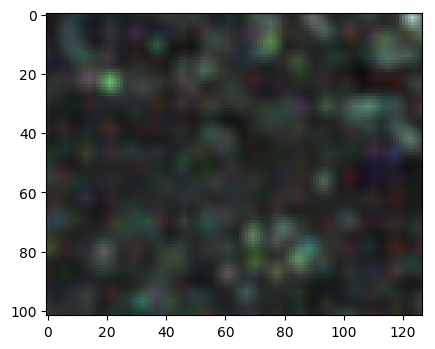

Original:  33.9685018865
Blur:  15.6472510145


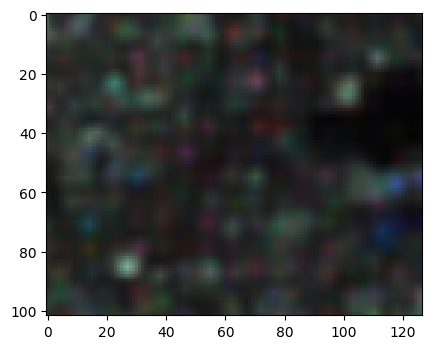

Original:  49.3443371982
Blur:  17.0806525592


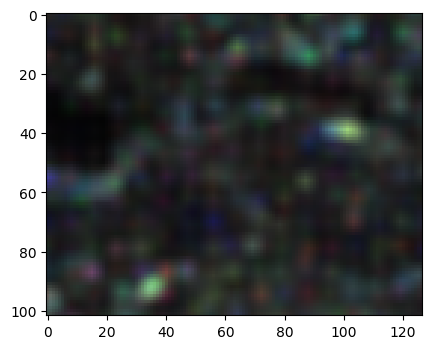

Original:  30.4890399092
Blur:  12.5756950715


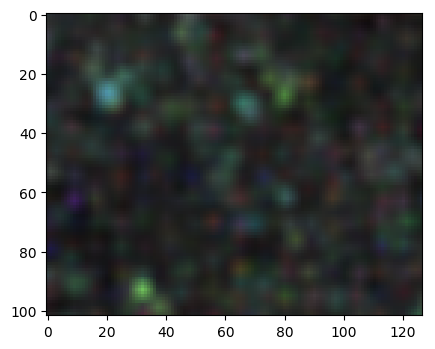

Original:  34.1109384505
Blur:  12.9273240469


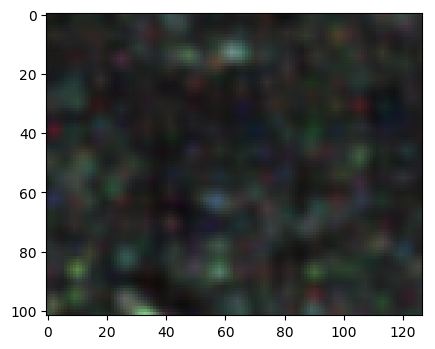

Original:  32.6523339395
Blur:  14.0819002531


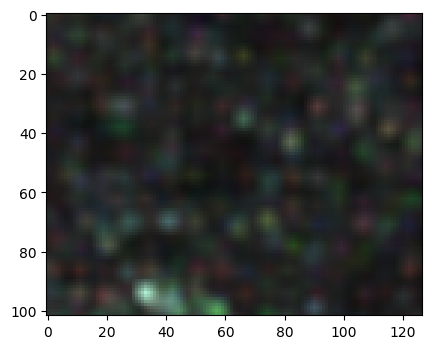

Original:  30.4331246073
Blur:  15.0541257147


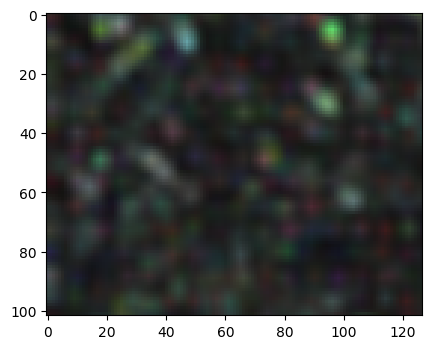

Original:  29.0043097443
Blur:  13.7853646399


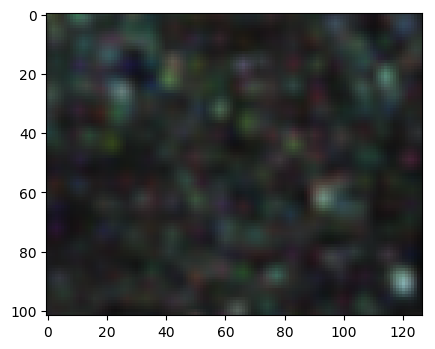

Original:  29.932187641
Blur:  17.5845477963


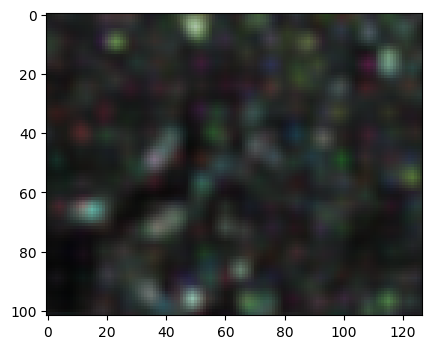

Original:  27.6270186799
Blur:  13.8889048133


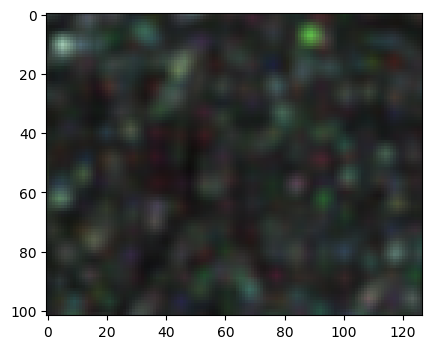

Original:  30.6748786296
Blur:  12.3099436558


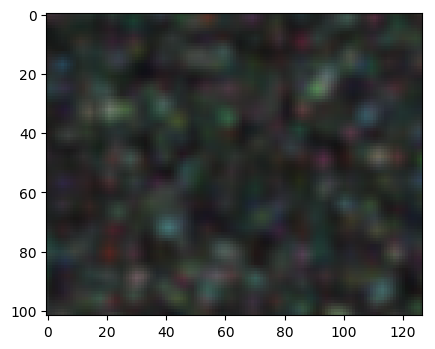

Original:  32.046889755
Blur:  15.638675588


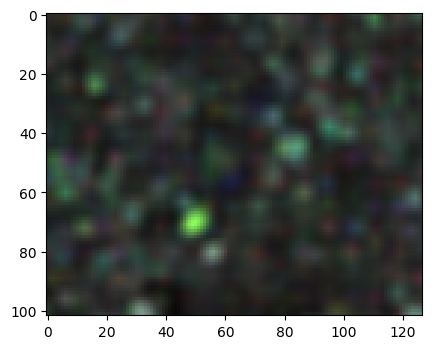

Original:  28.4929504433
Blur:  14.5488090194


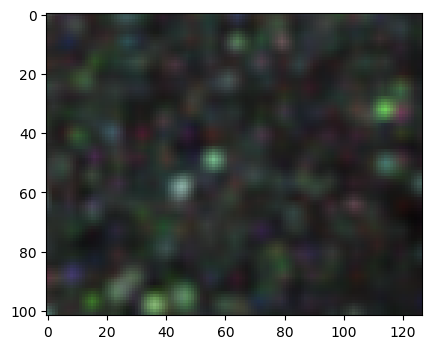

Original:  24.8131843769
Blur:  11.171139612


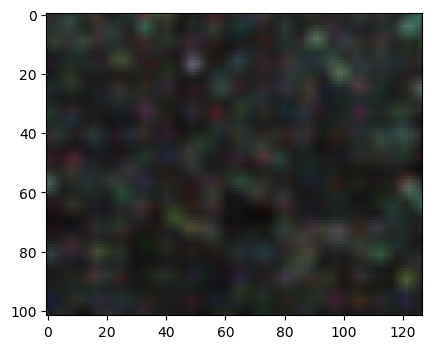

Original:  27.5497366991
Blur:  17.0785360742


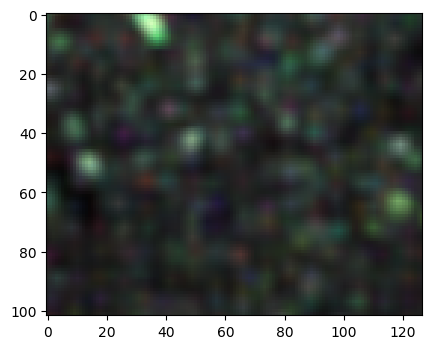

Original:  25.1070586805
Blur:  13.7405891349


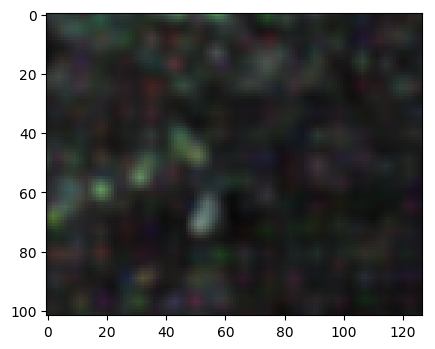

Original:  32.5177985911
Blur:  16.2168545956


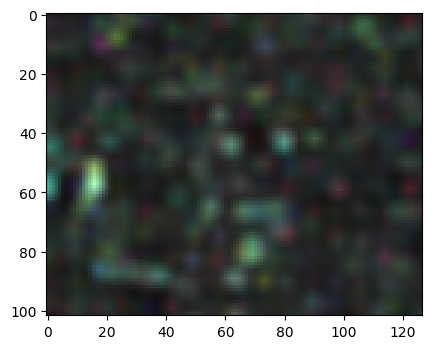

Original:  32.7610896342
Blur:  15.388131129


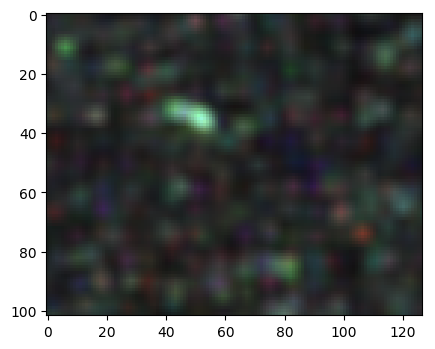

Original:  26.9496217543
Blur:  12.8690651371


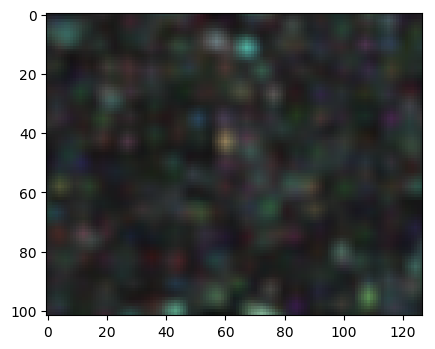

Original:  28.3910753439
Blur:  10.9554627601


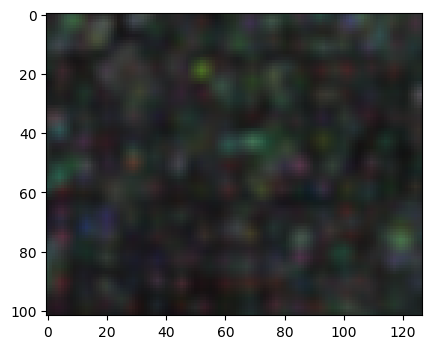

Original:  32.0808901696
Blur:  16.9040223981


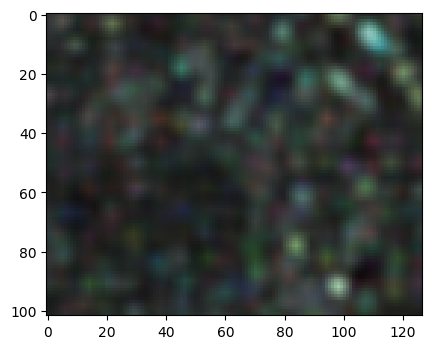

Original:  29.1589159314
Blur:  17.5967727828


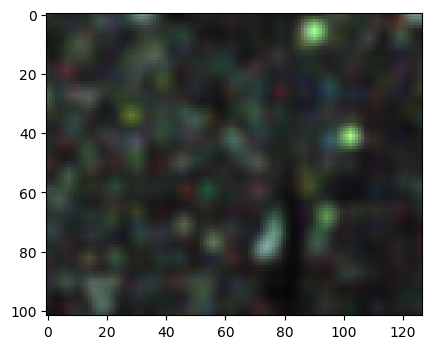

Original:  27.7114300984
Blur:  15.8276175796


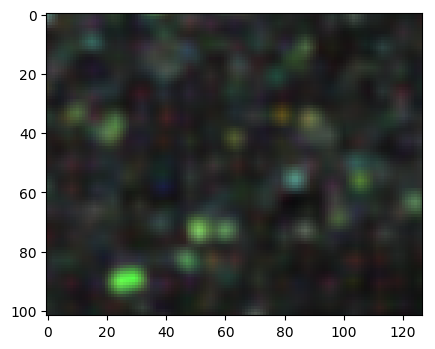

Original:  26.5477598187
Blur:  13.4766836983


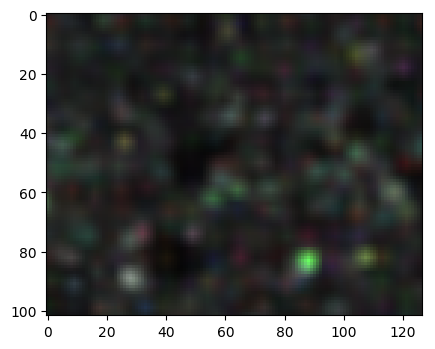

Original:  25.4672591608
Blur:  13.3635629461


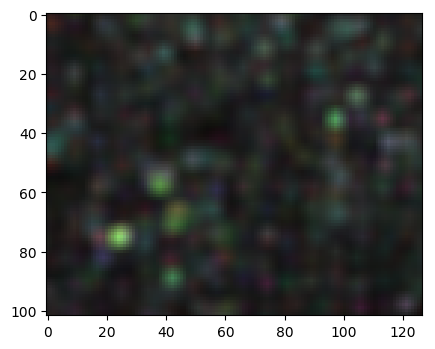

Original:  26.2591689937
Blur:  10.2901572854


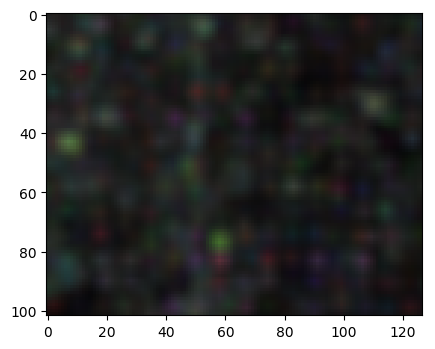

Original:  28.7939580473
Blur:  15.2969274951


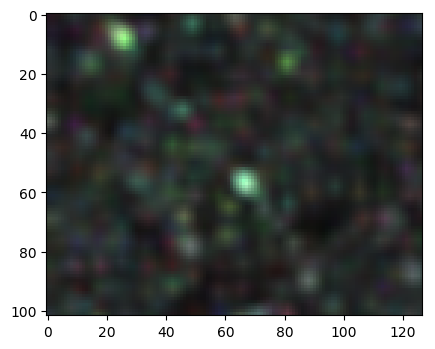

Original:  31.9453840499
Blur:  14.3421759611


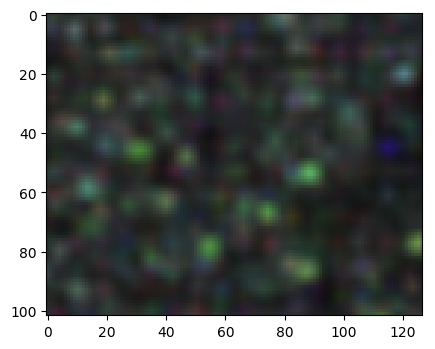

Original:  23.8959022298
Blur:  16.3037326363


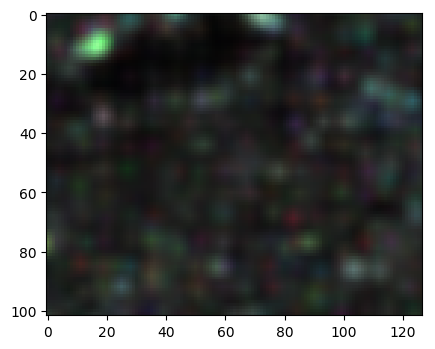

Original:  30.78952865
Blur:  13.4797918338


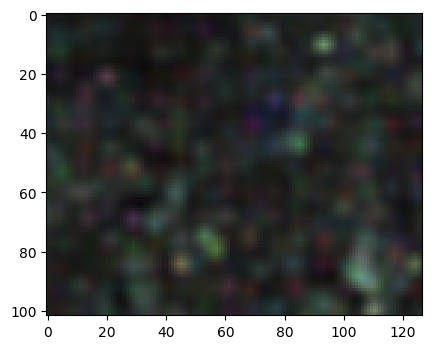

Original:  32.398686277
Blur:  17.6690035204


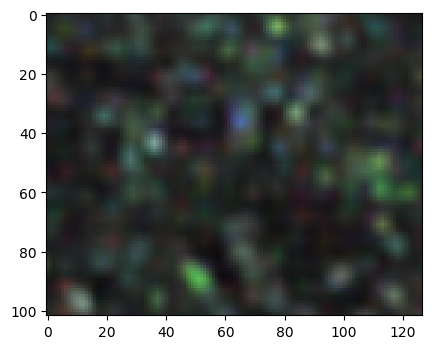

Original:  26.9461113763
Blur:  20.297279328


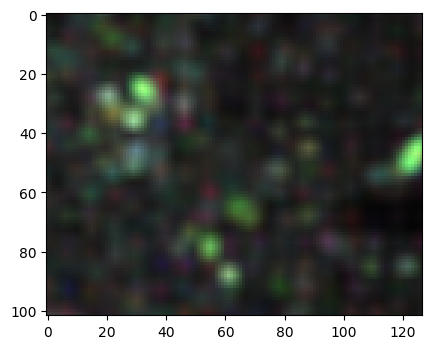

Original:  28.1582748096
Blur:  13.2896779038


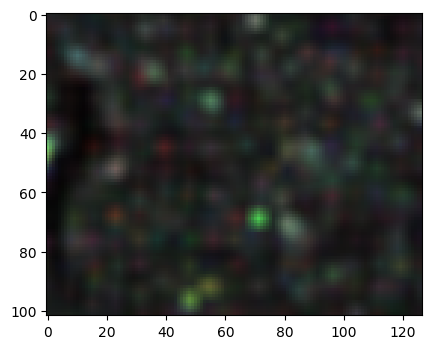

Original:  28.0642111617
Blur:  13.5434082966


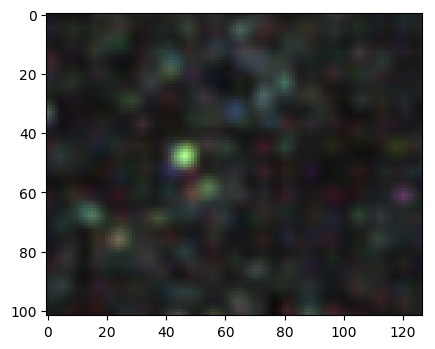

Original:  22.685653971
Blur:  11.0575179569


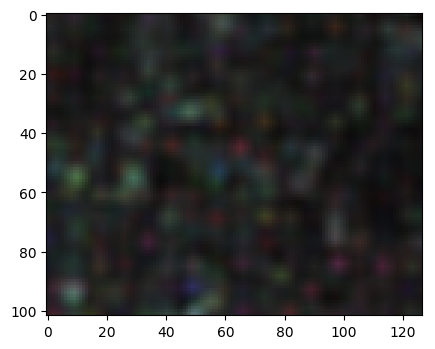

Original:  22.5799126482
Blur:  10.3700741497


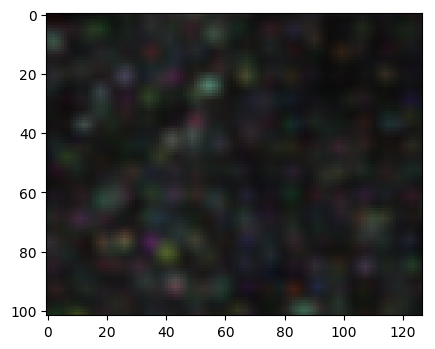

Original:  26.4971020485
Blur:  16.7446428823


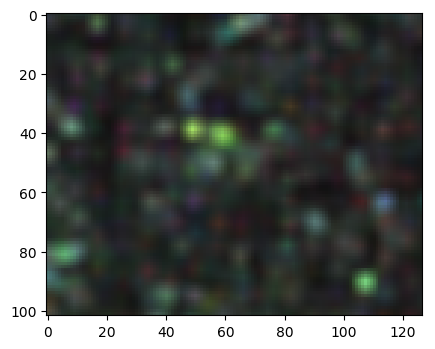

Original:  29.4019644148
Blur:  15.1152926464


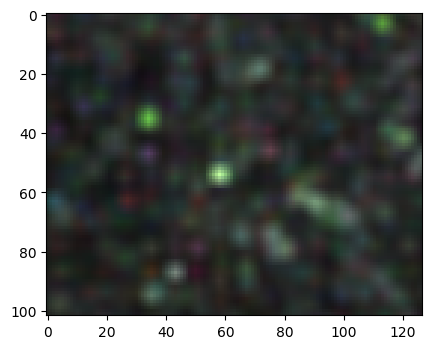

Original:  25.6192575538
Blur:  10.5989345714


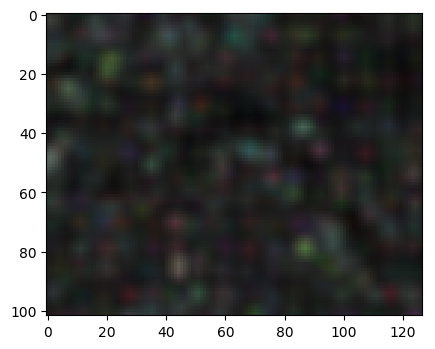

Original:  27.5499277696
Blur:  15.4201486825


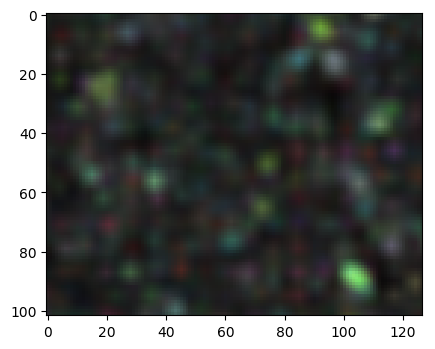

Original:  28.5412293565
Blur:  15.2301517567


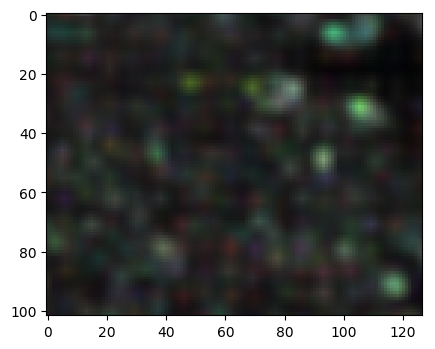

Original:  29.6733866049
Blur:  16.9080353461


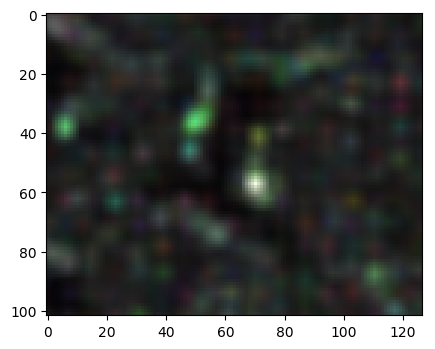

Original:  23.1779695453
Blur:  11.0843099055


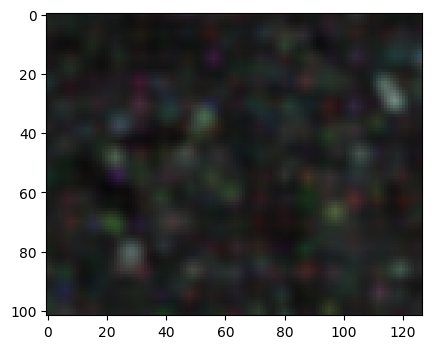

Original:  26.4219818694
Blur:  14.5654957518


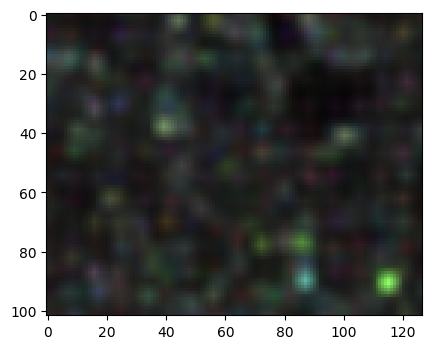

Original:  22.1483269538
Blur:  14.7930201132


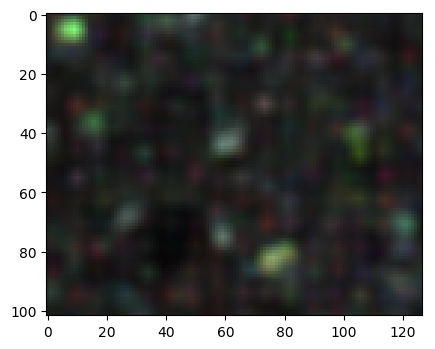

Original:  26.9034735012
Blur:  10.8816895526


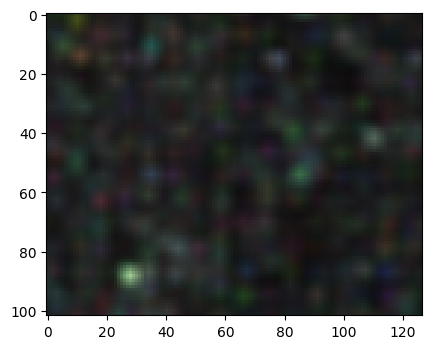

Original:  31.5773856229
Blur:  13.8577325688


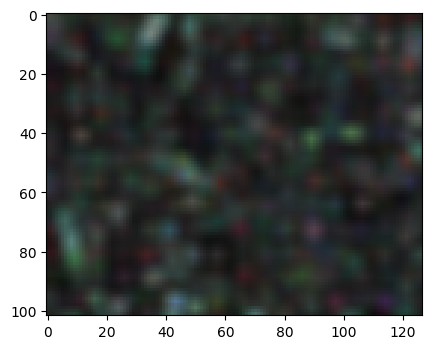

Original:  27.7914674634
Blur:  19.8089568264


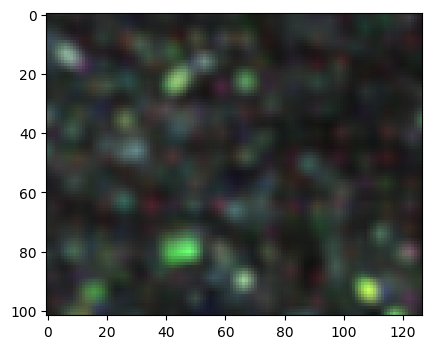

Original:  30.1611225273
Blur:  17.2149385891


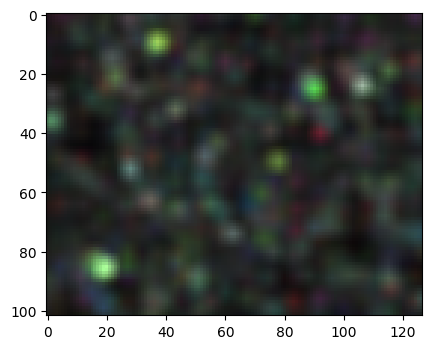

Original:  33.5995865757
Blur:  13.6672650932


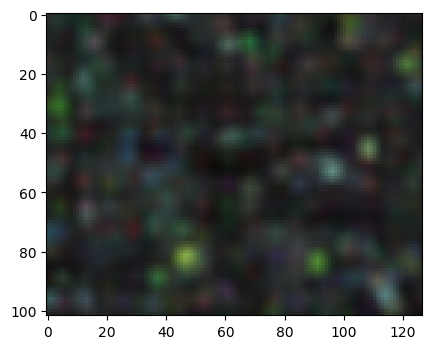

Original:  24.5361005515
Blur:  13.3823079264


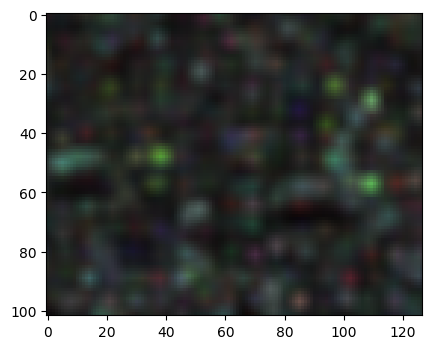

Original:  33.0100110353
Blur:  16.2379515331


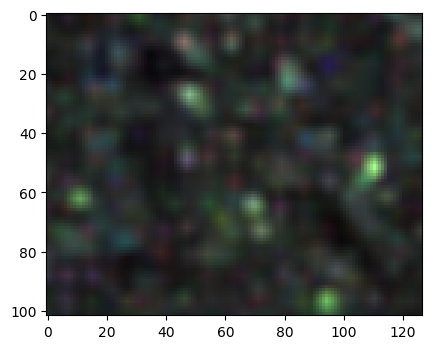

Original:  26.3307196114
Blur:  12.0688076934


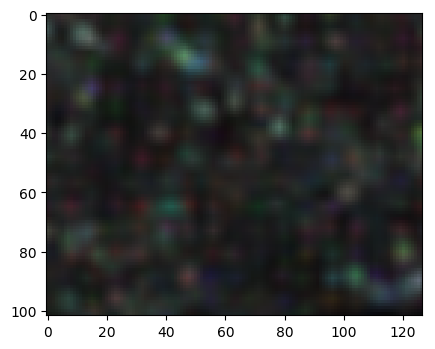

Original:  24.9441908352
Blur:  11.5357479733


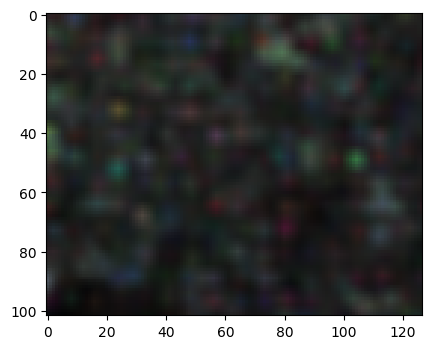

Original:  27.7279632404
Blur:  11.5333974444


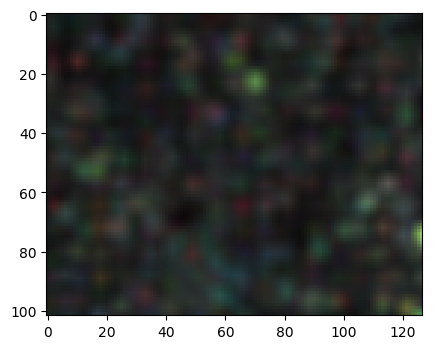

Original:  25.5369350783
Blur:  13.3789511695


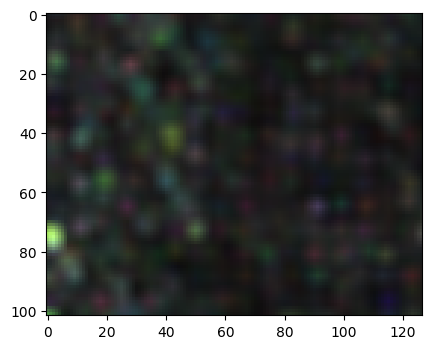

In [32]:
# Function does blurry testing from above but also shows each block of the image
#Along with the standard deviation from the "Blurred" image and original
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image60.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(crop, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        print "Original: ", np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        
        if a > 15:
            total_empty += 1
            print "Blur: ", np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            plt.imshow(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            plt.show()

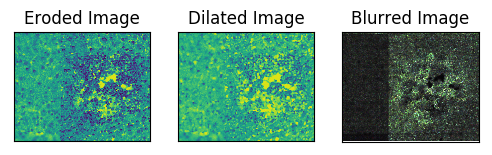

Blocks with tissue:  97
Percent of blocks w/ tissue:  97 %
Blurred blocks w/ tissue:  41
Blurred blocks out of 100:  41 %
Blurred blocks out of blocks w/ tissue:  42 %


In [33]:
#Function shows eroded, dilated and blurred image
#Mentions how many non empty blocks, how many blurred non empty blocks

import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image14.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(crop, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        if a > 15:
            total_empty += 1
            b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            if (b < 20):
                total_blur += 1
                
print "Blocks with tissue: ", total_empty
print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
print "Blurred blocks w/ tissue: ", total_blur
print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"

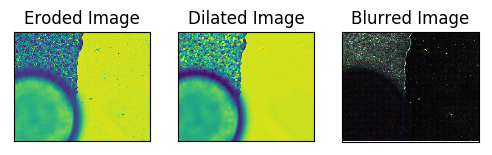

Blocks with tissue:  33
Percent of blocks w/ tissue:  33 %
Blurred blocks w/ tissue:  9
Blurred blocks out of 100:  9 %
Blurred blocks out of blocks w/ tissue:  27 %


In [34]:
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image12.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(crop, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        if a > 15:
            total_empty += 1
            b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            if (b < 10):
                total_blur += 1
                
print "Blocks with tissue: ", total_empty
print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
print "Blurred blocks w/ tissue: ", total_blur
print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"

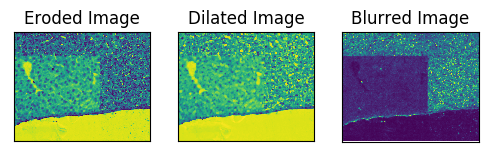

In [35]:
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image2.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(image, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        if a > 15:
            total_empty += 1
            b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            if (b < 10):
                total_blur += 1
                

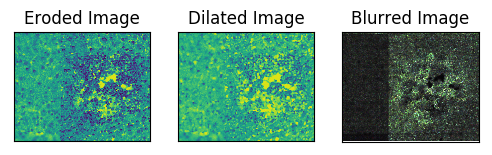

Blocks with tissue:  97
Percent of blocks w/ tissue:  97 %
Blurred blocks w/ tissue:  24
Blurred blocks out of 100:  24 %
Blurred blocks out of blocks w/ tissue:  24 %


In [36]:
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image14.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(crop, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        if a > 15:
            total_empty += 1
            b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            if (b < 10):
                total_blur += 1
                
print "Blocks with tissue: ", total_empty
print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
print "Blurred blocks w/ tissue: ", total_blur
print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"

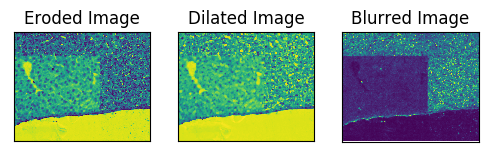

Blocks with tissue:  82
Percent of blocks w/ tissue:  82 %
Blurred blocks w/ tissue:  22
Blurred blocks out of 100:  22 %
Blurred blocks out of blocks w/ tissue:  26 %


In [37]:
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image2.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(image, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        if a > 15:
            total_empty += 1
            b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            if (b < 10):
                total_blur += 1
                
print "Blocks with tissue: ", total_empty
print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
print "Blurred blocks w/ tissue: ", total_blur
print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"

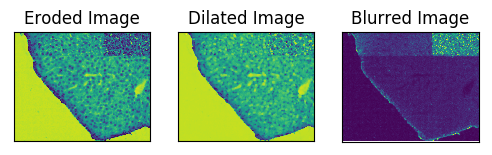

Blocks with tissue:  77
Percent of blocks w/ tissue:  77 %
Blurred blocks w/ tissue:  39
Blurred blocks out of 100:  39 %
Blurred blocks out of blocks w/ tissue:  50 %


In [38]:
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image3.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(image, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        if a > 15:
            total_empty += 1
            b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            if (b < 10):
                total_blur += 1
                
print "Blocks with tissue: ", total_empty
print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
print "Blurred blocks w/ tissue: ", total_blur
print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"

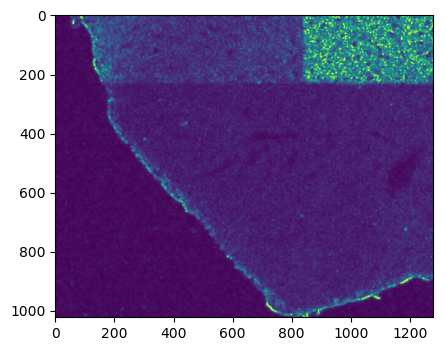

76


In [39]:
plt.imshow(blur)
plt.show()
cnt_10 = 0
r = blur.shape[0]/10
c = blur.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
        if (a <= 20):
            cnt_10+=1

print cnt_10

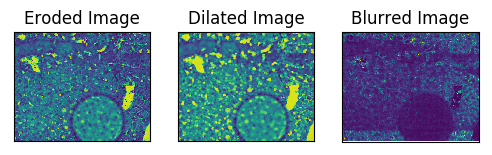

Blocks with tissue:  100
Percent of blocks w/ tissue:  100 %
Blurred blocks w/ tissue:  16
Blurred blocks out of 100:  16 %
Blurred blocks out of blocks w/ tissue:  16 %


In [40]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image47.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(image, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((5,5), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10
for i in range(10):
    for j in range(10):
        a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
        if a > 15:
            total_empty += 1
            b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
            if (b < 10):
                total_blur += 1
                
print "Blocks with tissue: ", total_empty
print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
print "Blurred blocks w/ tissue: ", total_blur
print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"

No bubble detected


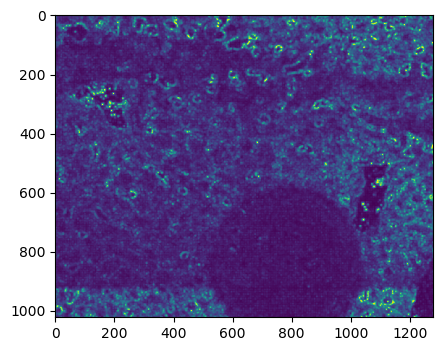

In [41]:

_,thresh = cv2.threshold(blur, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = blur[y:h+y, x:x+w]

mask = np.zeros(crop.shape, np.uint8)
retval, thresh = cv2.threshold(crop, 70, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

areaArray = []
count = 1
for i, c in enumerate(contours):
    area = cv2.contourArea(c)
    areaArray.append(area)

c = []
sorteddata = sorted(zip(areaArray, contours), key=lambda x: x[0], reverse=True)
for i in range(len(sorteddata)):
    cnt = sorteddata[i][1]
    leftmost = tuple(cnt[cnt[:,:,0].argmin()][0])
    rightmost = tuple(cnt[cnt[:,:,0].argmax()][0])
    bottommost = tuple(cnt[cnt[:,:,1].argmin()][0])
    topmost = tuple(cnt[cnt[:,:,1].argmax()][0])

    if (((leftmost[0] <= 2) and (bottommost[1] <= 2) and (rightmost[0] >= crop.shape[1]-2) and (topmost[1] >= crop.shape[0]-2)) == 0):
        area = cv2.contourArea(cnt)
        if (area >= 15000.0):
            perimeter = cv2.arcLength(cnt, True)
            if (perimeter != 0.0):
                if ((4*np.pi*area)/(perimeter*perimeter) >= 0.45):
                    c = cnt
if len(c) == 0:
    print "No bubble detected"
    plt.imshow(blur)
    plt.show()
else:
    cv2.drawContours(mask, c, -1, (255,0,0), 2)
    cv2.imshow("contours", mask)
    cv2.waitKey(-1)

No bubble detected


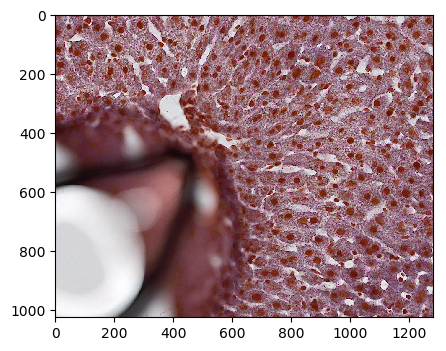

In [42]:
img = cv2.imread("../Images/Image59.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = gray[y:h+y, x:x+w]

mask = np.zeros(crop.shape, np.uint8)
#retval, thresh = cv2.threshold(crop, 87, 255, cv2.THRESH_BINARY)
t2 = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,5,10)
contours, hierarchy = cv2.findContours(t2, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

areaArray = []
count = 1
for i, c in enumerate(contours):
    area = cv2.contourArea(c)
    areaArray.append(area)

c = []
sorteddata = sorted(zip(areaArray, contours), key=lambda x: x[0], reverse=True)
for i in range(len(sorteddata)):
    cnt = sorteddata[i][1]
    leftmost = tuple(cnt[cnt[:,:,0].argmin()][0])
    rightmost = tuple(cnt[cnt[:,:,0].argmax()][0])
    bottommost = tuple(cnt[cnt[:,:,1].argmin()][0])
    topmost = tuple(cnt[cnt[:,:,1].argmax()][0])

    if (((leftmost[0] <= 2) and (bottommost[1] <= 2) and (rightmost[0] >= crop.shape[1]-2) and (topmost[1] >= crop.shape[0]-2)) == 0):
        area = cv2.contourArea(cnt)
        if (area >= 10000.0):
            perimeter = cv2.arcLength(cnt, True)
            if (perimeter != 0.0):
                if ((4*np.pi*area)/(perimeter*perimeter) >= 0.45):
                    c = cnt
if len(c) == 0:
    print "No bubble detected"
    plt.imshow(img)
    plt.show()
else:
    cv2.drawContours(mask, c, -1, (255,0,0), 2)
    cv2.imshow("contours", mask)
    cv2.waitKey(-1)

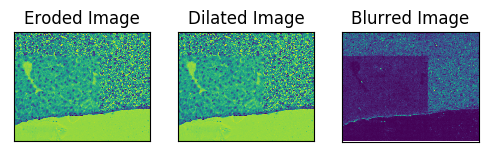

Thresh:  0
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  1
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  2
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  3
Blurred blocks out of blocks w/ tissue:  4 %

Thresh:  4
Blurred blocks out of blocks w/ tissue:  9 %

Thresh:  5
Blurred blocks out of blocks w/ tissue:  12 %

Thresh:  6
Blurred blocks out of blocks w/ tissue:  14 %

Thresh:  7
Blurred blocks out of blocks w/ tissue:  16 %

Thresh:  8
Blurred blocks out of blocks w/ tissue:  18 %

Thresh:  9
Blurred blocks out of blocks w/ tissue:  20 %

Thresh:  10
Blurred blocks out of blocks w/ tissue:  21 %

Thresh:  11
Blurred blocks out of blocks w/ tissue:  24 %

Thresh:  12
Blurred blocks out of blocks w/ tissue:  27 %

Thresh:  13
Blurred blocks out of blocks w/ tissue:  31 %

Thresh:  14
Blurred blocks out of blocks w/ tissue:  35 %

Thresh:  15
Blurred blocks out of blocks w/ tissue:  39 %

Thresh:  16
Blurred blocks out of blocks w/ tissue:  42 %

Thresh:  17


In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image2.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(image, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((1,1), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10

for times in range(50):
    for i in range(10):
        for j in range(10):
            a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
            if a > 15:
                total_empty += 1
                b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
                if (b <= times):
                    total_blur += 1
    print "Thresh: ", times
    #print "Blocks with tissue: ", total_empty
    #print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
    #print "Blurred blocks w/ tissue: ", total_blur
    #print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
    print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"
    print

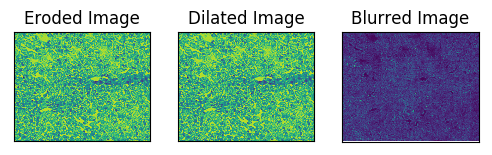

Thresh:  0
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  1
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  2
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  3
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  4
Blurred blocks out of blocks w/ tissue:  0 %

Thresh:  5
Blurred blocks out of blocks w/ tissue:  7 %

Thresh:  6
Blurred blocks out of blocks w/ tissue:  18 %

Thresh:  7
Blurred blocks out of blocks w/ tissue:  28 %

Thresh:  8
Blurred blocks out of blocks w/ tissue:  36 %

Thresh:  9
Blurred blocks out of blocks w/ tissue:  43 %

Thresh:  10
Blurred blocks out of blocks w/ tissue:  48 %

Thresh:  11
Blurred blocks out of blocks w/ tissue:  52 %

Thresh:  12
Blurred blocks out of blocks w/ tissue:  56 %

Thresh:  13
Blurred blocks out of blocks w/ tissue:  59 %

Thresh:  14
Blurred blocks out of blocks w/ tissue:  62 %

Thresh:  15
Blurred blocks out of blocks w/ tissue:  64 %

Thresh:  16
Blurred blocks out of blocks w/ tissue:  66 %

Thresh:  17
B

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread("../Images/Image60.tif")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
c, h = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnt = c[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:h+y, x:x+w]
image = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


laplacian = cv2.Laplacian(image, cv2.CV_64F)
scale = cv2.convertScaleAbs(laplacian)
kernel = np.ones((1,1), np.uint8)
dilation2 = cv2.dilate(scale, kernel, iterations=1)
blur = cv2.GaussianBlur(dilation2,(5,5),5)

erosion=cv2.erode(image, kernel, iterations=1)
dilation = cv2.dilate(erosion, kernel, iterations=2)
plt.subplot(131), plt.imshow(erosion)
plt.title("Eroded Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(dilation)
plt.title("Dilated Image"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(blur)
plt.title("Blurred Image"), plt.xticks([]), plt.yticks([])
plt.show()
total_empty = 0
total_blur = 0
r = dilation.shape[0]/10
c = dilation.shape[1]/10

for times in range(50):
    for i in range(10):
        for j in range(10):
            a = np.std(dilation[i*r:(i+1)*r, j*c:(j+1)*c])
            if a > 15:
                total_empty += 1
                b = np.std(blur[i*r:(i+1)*r, j*c:(j+1)*c])
                if (b <= times):
                    total_blur += 1
    print "Thresh: ", times
    #print "Blocks with tissue: ", total_empty
    #print "Percent of blocks w/ tissue: ", (total_empty*100 )/100 ,"%"
    #print "Blurred blocks w/ tissue: ", total_blur
    #print "Blurred blocks out of 100: ",(total_blur*100)/100,"%"
    print "Blurred blocks out of blocks w/ tissue: ",(total_blur*100)/total_empty,"%"
    print